In [1]:
# Import some libraries

import pandas as pd
import nltk
pd.options.mode.chained_assignment = None
import numpy as np
seed = 0
np.random.seed(seed)
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style = 'whitegrid')

!pip install twint
import twint
import nest_asyncio
nest_asyncio.apply()


import datetime as dt
import re
import string
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

!pip install Sastrawi
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory
from wordcloud import WordCloud

from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from keras.models import Sequential
from keras.layers import Embedding, Dense, Dropout, LSTM
from keras.optimizers import Adam, RMSprop, SGD
from keras.callbacks import EarlyStopping
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import GridSearchCV
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix

You should consider upgrading via the '/Users/harshal/opt/anaconda3/bin/python -m pip install --upgrade pip' command.
You should consider upgrading via the '/Users/harshal/opt/anaconda3/bin/python -m pip install --upgrade pip' command.


# Authentication
consumerKey = '59oDfXxmBBm22p2j3Gowy4lEE'
consumerSecret = "bZufUMPivqtX94xG4Bt3QmsmqyL7TsDbkW8Kuo3cGYeFfKoysY"
accessToken = "3060838521-u5eXreDFHOqaxUcvTYMFyuEXImu5RlpdiY436h8"
accessTokenSecret = "Q55FxITLmzlJWW4xpNbwnsW2UPXQZL4KiOWf9QdsDlYKt"
        
auth = tweepy.OAuthHandler(consumerKey, consumerSecret)
auth.set_access_token(accessToken, accessTokenSecret)
api = tweepy.API(auth)

In [2]:
import twint
import nest_asyncio
nest_asyncio.apply()

c = twint.Config()
c.Store_object = True
c.Pandas =True
c.Search = "Covid"
c.Place = 'United States'
c.Since = "2020-03-01"
c.Until = "2020-05-31"
c.Limit = 50000
c.Lang = 'en'
twint.run.Search(c)
df = twint.storage.panda.Tweets_df

1266882078823665671 2020-05-31 05:29:59 +0530 <corcho_hector> Más de seis millones de personas contagiadas por la COVID-19 en el mundo ( Video)  https://t.co/vjUK98pvA0 Via @Granma_Digital
1266882078454484992 2020-05-31 05:29:59 +0530 <Debbiesplace65> @_cinnamonro11_ @Hu4Msu I've signed the petition &amp; the open letter. In my own country tweeted the names of  those that have suffered here from our police murdering them &amp; ensured an article was removed from my local paper claiming black people are more likely to catch covid &amp; spreading it to others etc
1266882076869120001 2020-05-31 05:29:59 +0530 <iOptimizeRealty> COVID-19 and Your Office Renewal #CRE #Renewal #Covid-19   https://t.co/OxxM9U11je
1266882075501740040 2020-05-31 05:29:58 +0530 <jeferson035> @dannielHF_ @xcapim360 Xbox Mil Grau espalhando toxicidade mais q COVID
1266882074641936385 2020-05-31 05:29:58 +0530 <Steph_120902> @WhiteHouse @realDonaldTrump Imagine if you'd been a leader filled with Christian love and a

In [3]:
df = df[df['language'] == 'en']
df

,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,cashtags,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
1,1266882078454484992,1266875283618975744,1.590883e+12,2020-05-31 05:29:59,+0530,,@_cinnamonro11_ @Hu4Msu I've signed the petiti...,en,[],[],...,,,,,,[],,,,
2,1266882076869120001,1266882076869120001,1.590883e+12,2020-05-31 05:29:59,+0530,,COVID-19 and Your Office Renewal #CRE #Renewal...,en,"[cre, renewal, covid]",[],...,,,,,,[],,,,
4,1266882074641936385,1266846190001422337,1.590883e+12,2020-05-31 05:29:58,+0530,,@WhiteHouse @realDonaldTrump Imagine if you'd ...,en,[],[],...,,,,,,"[{'screen_name': 'WhiteHouse', 'name': 'The Wh...",,,,
6,1266882073685606406,1266882073685606406,1.590883e+12,2020-05-31 05:29:58,+0530,,chile i almost forgot ab miss covid 19,en,[],[],...,,,,,,[],,,,
8,1266882072242614273,1266767682927390726,1.590883e+12,2020-05-31 05:29:58,+0530,,"@RichardBarrow I finally found out that, if yo...",en,[],[],...,,,,,,"[{'screen_name': 'RichardBarrow', 'name': 'Ric...",,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49994,1266830552562352129,1266804954192379904,1.590871e+12,2020-05-31 02:05:14,+0530,,@AngelaH08745929 Foolish Covid 19 will kill so...,en,[],[],...,,,,,,[],,,,
49995,1266830551484370944,1266830551484370944,1.590871e+12,2020-05-31 02:05:14,+0530,,White Supremist Terrorists want genocide Puert...,en,"[gopconcentrationcamps, onelaw4all, trumpmustr...",[],...,,,,,,[],,,,
49996,1266830548259004416,1266828293585752067,1.590871e+12,2020-05-31 02:05:13,+0530,,@pittso Crazy to think how many problems that ...,en,[],[],...,,,,,,"[{'screen_name': 'pittso', 'name': 'Mike Pitts...",,,,
49998,1266830544253353984,1266801823412879360,1.590871e+12,2020-05-31 02:05:12,+0530,,@nypost They had someone far smarter than Cuom...,en,[],[],...,,,,,,"[{'screen_name': 'nypost', 'name': 'New York P...",,,,


In [4]:
# Load data from a CSV file into pandas DataFrame
tweets_data = df
tweets = tweets_data[['id', 'username', 'created_at', 'tweet']]# 'replies_count', 'retweets_count', 'likes_count']]
tweets

,id,username,created_at,tweet
1,1266882078454484992,Debbiesplace65,1.590883e+12,@_cinnamonro11_ @Hu4Msu I've signed the petiti...
2,1266882076869120001,iOptimizeRealty,1.590883e+12,COVID-19 and Your Office Renewal #CRE #Renewal...
4,1266882074641936385,Steph_120902,1.590883e+12,@WhiteHouse @realDonaldTrump Imagine if you'd ...
6,1266882073685606406,jungthot,1.590883e+12,chile i almost forgot ab miss covid 19
8,1266882072242614273,samuisoul,1.590883e+12,"@RichardBarrow I finally found out that, if yo..."
...,...,...,...,...
49994,1266830552562352129,thanksEU4_0,1.590871e+12,@AngelaH08745929 Foolish Covid 19 will kill so...
49995,1266830551484370944,Multijo1,1.590871e+12,White Supremist Terrorists want genocide Puert...
49996,1266830548259004416,Josh_Artus,1.590871e+12,@pittso Crazy to think how many problems that ...
49998,1266830544253353984,Mortification13,1.590871e+12,@nypost They had someone far smarter than Cuom...


In [5]:
import time
time_list = [time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(n/1000)) for n in tweets['created_at'].values]
tweets['created_at'] = time_list
tweets

,id,username,created_at,tweet
1,1266882078454484992,Debbiesplace65,2020-05-31 05:29:59,@_cinnamonro11_ @Hu4Msu I've signed the petiti...
2,1266882076869120001,iOptimizeRealty,2020-05-31 05:29:59,COVID-19 and Your Office Renewal #CRE #Renewal...
4,1266882074641936385,Steph_120902,2020-05-31 05:29:58,@WhiteHouse @realDonaldTrump Imagine if you'd ...
6,1266882073685606406,jungthot,2020-05-31 05:29:58,chile i almost forgot ab miss covid 19
8,1266882072242614273,samuisoul,2020-05-31 05:29:58,"@RichardBarrow I finally found out that, if yo..."
...,...,...,...,...
49994,1266830552562352129,thanksEU4_0,2020-05-31 02:05:14,@AngelaH08745929 Foolish Covid 19 will kill so...
49995,1266830551484370944,Multijo1,2020-05-31 02:05:14,White Supremist Terrorists want genocide Puert...
49996,1266830548259004416,Josh_Artus,2020-05-31 02:05:13,@pittso Crazy to think how many problems that ...
49998,1266830544253353984,Mortification13,2020-05-31 02:05:12,@nypost They had someone far smarter than Cuom...


In [6]:
# Some functions for preprocessing text

def cleaningText(text):
    text = re.sub(r'@[A-Za-z0-9]+', '', text) # remove mentions
    text = re.sub(r'#[A-Za-z0-9]+', '', text) # remove hashtag
    text = re.sub(r'RT[\s]', '', text) # remove RT
    text = re.sub(r"http\S+", '', text) # remove link
    text = re.sub(r'[0-9]+', '', text) # remove numbers

    text = text.replace('\n', ' ') # replace new line into space
    text = text.translate(str.maketrans('', '', string.punctuation)) # remove all punctuations
    text = text.strip(' ') # remove characters space from both left and right text
    return text

def casefoldingText(text): # Converting all the characters in a text into lower case
    text = text.lower() 
    return text

def tokenizingText(text): # Tokenizing or splitting a string, text into a list of tokens
    text = word_tokenize(text) 
    return text

def filteringText(text): # Remove stopwors in a text
    listStopwords = set(stopwords.words('english'))
    filtered = []
    for txt in text:
        if txt not in listStopwords:
            filtered.append(txt)
    text = filtered 
    return text

ps = nltk.PorterStemmer()

def stemmingText(text):
    text = [ps.stem(word) for word in text]
    return text

#def stemmingText(text): # Reducing a word to its word stem that affixes to suffixes and prefixes or to the roots of words
 #   factory = StemmerFactory()
  #  stemmer = factory.create_stemmer()
   # text = [stemmer.stem(word) for word in text]
    #return text

def toSentence(list_words): # Convert list of words into sentence
    sentence = ' '.join(word for word in list_words)
    return sentence

In [7]:
#Preprocessing tweets data

tweets['text_clean'] = tweets['tweet'].apply(cleaningText)
tweets['text_clean'] = tweets['text_clean'].apply(casefoldingText)
tweets.drop(['tweet'], axis = 1, inplace = True)

tweets['text_preprocessed'] = tweets['text_clean'].apply(tokenizingText)
tweets['text_preprocessed'] = tweets['text_preprocessed'].apply(filteringText)
tweets['text_preprocessed'] = tweets['text_preprocessed'].apply(stemmingText)

#drop duplicates/spams tweets
tweets.drop_duplicates(subset = 'text_clean', inplace = True)

#Export to csv file
tweets.to_csv(r'25k_tweets_data_clean.csv', index = False, header = True,index_label=None)

tweets

,id,username,created_at,text_clean,text_preprocessed
1,1266882078454484992,Debbiesplace65,2020-05-31 05:29:59,cinnamonro ive signed the petition amp the op...,"[cinnamonro, ive, sign, petit, amp, open, lett..."
2,1266882076869120001,iOptimizeRealty,2020-05-31 05:29:59,covid and your office renewal,"[covid, offic, renew]"
4,1266882074641936385,Steph_120902,2020-05-31 05:29:58,imagine if youd been a leader filled with chri...,"[imagin, youd, leader, fill, christian, love, ..."
6,1266882073685606406,jungthot,2020-05-31 05:29:58,chile i almost forgot ab miss covid,"[chile, almost, forgot, ab, miss, covid]"
8,1266882072242614273,samuisoul,2020-05-31 05:29:58,i finally found out that if you are a resident...,"[final, found, resid, bangkok, fli, samui, mus..."
...,...,...,...,...,...
49994,1266830552562352129,thanksEU4_0,2020-05-31 02:05:14,foolish covid will kill some who will they bl...,"[foolish, covid, kill, blame, cum, fool]"
49995,1266830551484370944,Multijo1,2020-05-31 02:05:14,white supremist terrorists want genocide puert...,"[white, supremist, terrorist, want, genocid, p..."
49996,1266830548259004416,Josh_Artus,2020-05-31 02:05:13,crazy to think how many problems that money sp...,"[crazi, think, mani, problem, money, spent, co..."
49998,1266830544253353984,Mortification13,2020-05-31 02:05:12,they had someone far smarter than cuomo runnin...,"[someon, far, smarter, cuomo, run, thing, put,..."


In [8]:
# Because preprocessing tweets data takes a lot time, so I load tweets data which has been preprocessed before
#tweets = pd.read_csv('../input/american-airlines-tweets/American Airline Tweets.csv')
tweet_list = []
for i in range(len(tweets['text_preprocessed'].values)):
    #print(tweets['text_preprocessed'][i])
    tweet_ = tweets['text_preprocessed'].values[i]
    tweet_ = [n for n in tweet_ if n not in ["'", ',', ']','[']]   
    tweet_list.append(tweet_)
    
tweets['text_preprocessed'] = tweet_list
tweets

,id,username,created_at,text_clean,text_preprocessed
1,1266882078454484992,Debbiesplace65,2020-05-31 05:29:59,cinnamonro ive signed the petition amp the op...,"[cinnamonro, ive, sign, petit, amp, open, lett..."
2,1266882076869120001,iOptimizeRealty,2020-05-31 05:29:59,covid and your office renewal,"[covid, offic, renew]"
4,1266882074641936385,Steph_120902,2020-05-31 05:29:58,imagine if youd been a leader filled with chri...,"[imagin, youd, leader, fill, christian, love, ..."
6,1266882073685606406,jungthot,2020-05-31 05:29:58,chile i almost forgot ab miss covid,"[chile, almost, forgot, ab, miss, covid]"
8,1266882072242614273,samuisoul,2020-05-31 05:29:58,i finally found out that if you are a resident...,"[final, found, resid, bangkok, fli, samui, mus..."
...,...,...,...,...,...
49994,1266830552562352129,thanksEU4_0,2020-05-31 02:05:14,foolish covid will kill some who will they bl...,"[foolish, covid, kill, blame, cum, fool]"
49995,1266830551484370944,Multijo1,2020-05-31 02:05:14,white supremist terrorists want genocide puert...,"[white, supremist, terrorist, want, genocid, p..."
49996,1266830548259004416,Josh_Artus,2020-05-31 02:05:13,crazy to think how many problems that money sp...,"[crazi, think, mani, problem, money, spent, co..."
49998,1266830544253353984,Mortification13,2020-05-31 02:05:12,they had someone far smarter than cuomo runnin...,"[someon, far, smarter, cuomo, run, thing, put,..."


#Extracting text values
text_all = tweet_list[0].values
text_neutral = neutral_list[0].values
text_positive = positive_list[0].values
text_negative = negative_list[0].values

In [9]:
# Determine sentiment polarity of tweets using indonesia sentiment lexicon (source : https://github.com/fajri91/InSet)

# Loads lexicon positive and negative data
lexicon_positive = dict()
lexicon_negative = dict()
import csv
words_strength = pd.read_excel('/Users/harshal/Desktop/Columbia Courses/Morgan Stanley Challenge/sentimentstrength-master/wordwithStrength.xlsx')
#with open('../input/words-strength/wordwithStrength.txt', 'r') as csvfile:
    #reader = csv.reader(csvfile, delimiter=',')
    #print(reader)
words = words_strength['words'].values
score = words_strength['score'].values
for n in range(len(words_strength)):
    if score[n] >= 0:
        lexicon_positive[words[n]] = (score[n])
    else:
        lexicon_negative[words[n]] = (score[n])

#lexicon_negative = dict()
#import csv
#with open('../input/lexicon-sentiment/negative-words.txt', 'r') as csvfile:
    #reader = csv.reader(csvfile, delimiter=',')
    #for row in reader:
        #lexicon_negative[row[0]] = int(row[1])
        
# Function to determine sentiment polarity of tweets        
def sentiment_analysis_lexicon_indonesia(text):
    #for word in text:
    score = 0
    for word in text:
        if (word in lexicon_positive):
            score = score + lexicon_positive[word]
    for word in text:
        if (word in lexicon_negative):
            score = score + lexicon_negative[word]
    polarity=''
    if (score > 0):
        polarity = 'positive'
    elif (score < 0):
        polarity = 'negative'
    else:
        polarity = 'neutral'
    return score, polarity

In [10]:
# Results from determine sentiment polarity of tweets

results = tweets['text_preprocessed'].apply(sentiment_analysis_lexicon_indonesia)
results = list(zip(*results))
tweets['polarity_score'] = results[0]
tweets['polarity'] = results[1]
print(tweets['polarity'].value_counts())

# Export to csv file
# tweets.to_csv(r'25k_tweets_data_clean_polarity.csv', index = False, header = True,index_label=None)

tweets

negative    10194
positive     9803
neutral      4863
Name: polarity, dtype: int64


,id,username,created_at,text_clean,text_preprocessed,polarity_score,polarity
1,1266882078454484992,Debbiesplace65,2020-05-31 05:29:59,cinnamonro ive signed the petition amp the op...,"[cinnamonro, ive, sign, petit, amp, open, lett...",-1.508929,negative
2,1266882076869120001,iOptimizeRealty,2020-05-31 05:29:59,covid and your office renewal,"[covid, offic, renew]",0.000000,neutral
4,1266882074641936385,Steph_120902,2020-05-31 05:29:58,imagine if youd been a leader filled with chri...,"[imagin, youd, leader, fill, christian, love, ...",1.554167,positive
6,1266882073685606406,jungthot,2020-05-31 05:29:58,chile i almost forgot ab miss covid,"[chile, almost, forgot, ab, miss, covid]",0.000000,neutral
8,1266882072242614273,samuisoul,2020-05-31 05:29:58,i finally found out that if you are a resident...,"[final, found, resid, bangkok, fli, samui, mus...",-0.625000,negative
...,...,...,...,...,...,...,...
49994,1266830552562352129,thanksEU4_0,2020-05-31 02:05:14,foolish covid will kill some who will they bl...,"[foolish, covid, kill, blame, cum, fool]",1.187500,positive
49995,1266830551484370944,Multijo1,2020-05-31 02:05:14,white supremist terrorists want genocide puert...,"[white, supremist, terrorist, want, genocid, p...",0.250000,positive
49996,1266830548259004416,Josh_Artus,2020-05-31 02:05:13,crazy to think how many problems that money sp...,"[crazi, think, mani, problem, money, spent, co...",1.508929,positive
49998,1266830544253353984,Mortification13,2020-05-31 02:05:12,they had someone far smarter than cuomo runnin...,"[someon, far, smarter, cuomo, run, thing, put,...",1.143750,positive


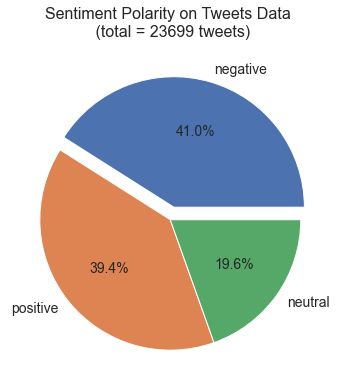

In [11]:
fig, ax = plt.subplots(figsize = (6, 6))
sizes = [count for count in tweets['polarity'].value_counts()]
labels = list(tweets['polarity'].value_counts().index)
explode = (0.1, 0, 0)
ax.pie(x = sizes, labels = labels, autopct = '%1.1f%%', explode = explode, textprops={'fontsize': 14})
ax.set_title('Sentiment Polarity on Tweets Data \n (total = 23699 tweets)', fontsize = 16, pad = 20)
plt.show()

In [12]:
pd.set_option('display.max_colwidth', 3000)
positive_tweets = tweets[tweets['polarity'] == 'positive']
positive_tweets = positive_tweets[['text_clean', 'polarity_score', 'polarity']].sort_values(by = 'polarity_score', ascending=False).reset_index(drop = True)
positive_tweets.index += 1
positive_tweets[0:10]

,text_clean,polarity_score,polarity
1,we bought a adapter from best buy on the th of march and when we had decided to return it we were being told best buy was only accepting pickups due to covid we held onto it until today when we found out best buy wouldn’t accept returns so we’re stuck with a product,4.625000,positive
2,riverside are superb in concert seen them many times and they get better and better each time got gazpachoprr tickets and iq later in the year if covid doesn’t put paid to the gigs have you tried galahad yet,3.802083,positive
3,could be rom its a good introduction to the album as well judging by the production and its sales but i think sl is the right lead single imo its the most distinctive sound in the record it just didnt have the proper lead single material treatment due to covid,3.802003,positive
4,the best time of year to sell your house is right around the corner while the home selling process is going to be different in the midst of the covid pandemic june is still a great time to sell and get a high premium for your home,3.778205,positive
5,australia well we have way less flu this year thanks to the social distancing i think the queensland chief health officer said that if someone turns up with flu symptoms they are more likely to have covid than influenza at this rate,3.466667,positive
6,john you’re put that fine american brain to use danny boy cuba actually sounds lovely beaches good food i’d love to have health care that doesn’t cost me anything the world thinks so as well considering they gladly accepted the assistance of cuban doctors fighting covid,3.302965,positive
7,ive had flu a couple of times had swine flu but this is not flu covid attacks your body makes you hotter than you have ever been a headache occurs that makes you cry then stops you breathing clap off flu my god its not,3.208333,positive
8,contact tracing is a core public health function and can help contain in main steps ⃣you test positive for covid ⃣an epidemiologist will ask who you’ve been in contact with in the last weeks ⃣your county health department will monitor you and your contacts,3.187500,positive
9,unlike the flu there’s no vaccine for covid and communitywide immunity hasn’t built up it is also far more infectious than the flu and has a higher death rate covid also has a higher rate of hospitalizations a little worse than the flu,3.187500,positive
10,as part of redline’s epic arts program i worked with arts street guiding youth from colorado high school charter working on a photography project and exhibit focused around documenting their lives during covid the virtual exhibit is live now,3.167857,positive


In [13]:
pd.set_option('display.max_colwidth', 3000)
negative_tweets = tweets[tweets['polarity'] == 'negative']
negative_tweets = negative_tweets[['text_clean', 'polarity_score', 'polarity']].sort_values(by = 'polarity_score', ascending=True)[0:10].reset_index(drop = True)
negative_tweets.index += 1
negative_tweets[0:10]

,text_clean,polarity_score,polarity
1,mp not typhoid mary but covid ian our covert covid ian not the black ford but the black spot tune in next week when he brings the pox of nationalism to some other previously peaceful people see him yell have at you english dog as he sits motionless eating fried cake,-4.930060,negative
2,regan life and work will never be normal until end baseless social distance end mask wearing protect gt yo w chronic diseases and recommend hcqazithzinc as prophylaxis and use early if covid open everything backup and protect high risk or misery continues forever,-4.225000,negative
3,life and work will never be normal until end baseless social distance end mask wearing protect gt yo w chronic diseases and recommend hcqazithzinc as prophylaxis and use early if covid open everything backup and protect high risk or misery continues forever,-4.225000,negative
4,rechecks number of deaths in usa on any day from any cause number of deaths usa on any day from covid number of deaths world wide on any day from any cause number of deaths world wide on any one day from covid interesting,-4.041667,negative
5,this is what happened to hundreds of thousands of the people that were supposed to be protected from the steps taken to stop a virus that compared to the damage caused by all the steps taken to stop the spread of it is less harmful than the common cold covid is a walk in the,-3.436538,negative
6,dude we thought twitter was brutal before covid the roman mob has nothing on this app once the lynch mob starts shut up and disappear five year just quietly resurface and never post anything,-3.250000,negative
7,too bad you didn’t use you unlimited power to save people from dying of covid too bad you didn’t use your unlimited power to save jobs for people too bad you are still president cheap grifter,-3.207721,negative
8,“covid is surely a present threat and danger to us an even greater danger than covid for some of our brothers and sisters is being black this country is guilty of a grave sin racism hate is it’s own hell conversion of heart is what’s necessary let us pray” father edwin,-3.199405,negative
9,i’m all for social distancing keeping parking lots closed and bathrooms but dogs need to be socialized regularly dog parks are essential why are they still locked dog don’t transmit covid and it’s essential that they are allowed to run,-3.156250,negative
10,i suspect it’ll be mixed bag of black block amp antifa with hard right covert militia types game is to stoke fires get it all heated up amp stir up most violent destructive elements over summer months while covid still rages then crack down in septemberoctober amp suppress vote,-3.056616,negative


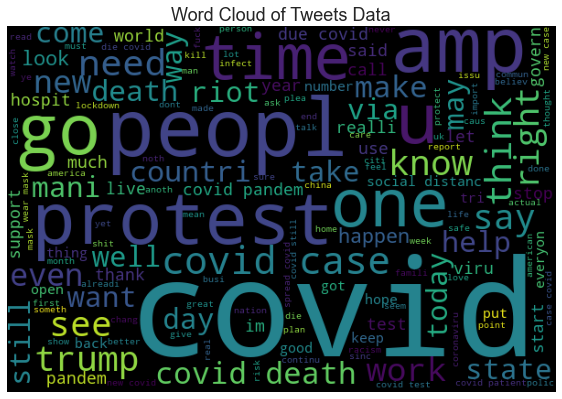

In [14]:
# Visualize word cloud

list_words=''
for tweet in tweets['text_preprocessed']:
    for word in tweet:
        list_words += ' '+(word)
        
wordcloud = WordCloud(width = 600, height = 400, background_color = 'black', min_font_size = 10).generate(list_words)
fig, ax = plt.subplots(figsize = (8, 6))
ax.set_title('Word Cloud of Tweets Data', fontsize = 18)
ax.grid(False)
ax.imshow((wordcloud))
fig.tight_layout(pad=0)
ax.axis('off')
plt.show()

In [15]:
# Function to group all positive/negative words
def words_with_sentiment(text):
    positive_words=[]
    negative_words=[]
    for word in text:
        score_pos = 0
        score_neg = 0
        if (word in lexicon_positive):
            score_pos = lexicon_positive[word]
        if (word in lexicon_negative):
            score_neg = lexicon_negative[word]
        
        if (score_pos + score_neg > 0):
            positive_words.append(word)
        elif (score_pos + score_neg < 0):
            negative_words.append(word)
            
    return positive_words, negative_words

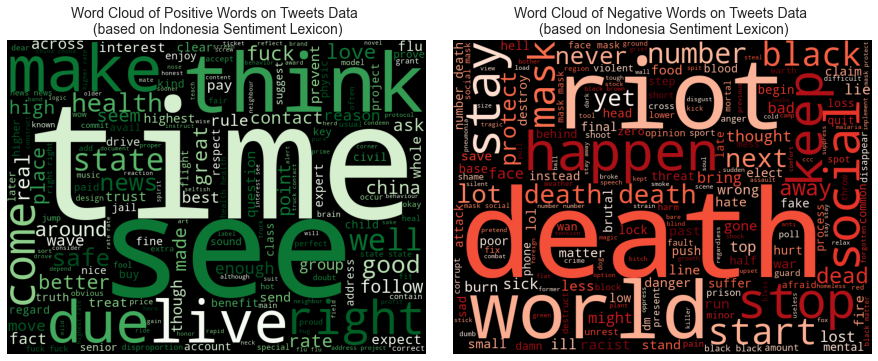

In [16]:
# Visualize positive and negative word cloud

sentiment_words = tweets['text_preprocessed'].apply(words_with_sentiment)
sentiment_words = list(zip(*sentiment_words))
positive_words = sentiment_words[0]
negative_words = sentiment_words[1]

fig, ax = plt.subplots(1, 2,figsize = (12, 10))
list_words_postive=''
for row_word in positive_words:
    for word in row_word:
        list_words_postive += ' '+(word)
wordcloud_positive = WordCloud(width = 800, height = 600, background_color = 'black', colormap = 'Greens'
                               , min_font_size = 10).generate(list_words_postive)
ax[0].set_title('Word Cloud of Positive Words on Tweets Data \n (based on Indonesia Sentiment Lexicon)', fontsize = 14)
ax[0].grid(False)
ax[0].imshow((wordcloud_positive))
fig.tight_layout(pad=0)
ax[0].axis('off')

list_words_negative=''
for row_word in negative_words:
    for word in row_word:
        list_words_negative += ' '+(word)
wordcloud_negative = WordCloud(width = 800, height = 600, background_color = 'black', colormap = 'Reds'
                               , min_font_size = 10).generate(list_words_negative)
ax[1].set_title('Word Cloud of Negative Words on Tweets Data \n (based on Indonesia Sentiment Lexicon)', fontsize = 14)
ax[1].grid(False)
ax[1].imshow((wordcloud_negative))
fig.tight_layout(pad=0)
ax[1].axis('off')

plt.show()